#Load Libraries

In [2]:
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import tarfile
import cv2
import numpy as np
filename = "helper.py"
%load filename
with open(filename) as infile:
    exec(infile.read())
from random import randint
import random
from skimage.util import random_noise

#Load Images

In [3]:
!gdown https://drive.google.com/uc?id=1X_MNpoFjPVNfF9RQjOG3zcjCtHJha2Sj
my_tar = tarfile.open('images.tar.gz')
my_tar.extractall('./') # specify which folder to extract to
my_tar.close()
image_paths = (glob.glob("./images/images/*.*"))

Downloading...
From: https://drive.google.com/uc?id=1X_MNpoFjPVNfF9RQjOG3zcjCtHJha2Sj
To: /content/images.tar.gz
100% 351k/351k [00:00<00:00, 50.8MB/s]


#Generic function To display Images

In [4]:
def displayImage(image, title=None):
  plt.imshow(image)
  if(title != None):
    plt.title(title) 
  plt.show()

#Task 2.1

##RGB Images

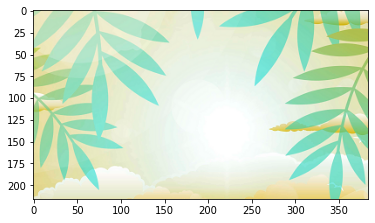

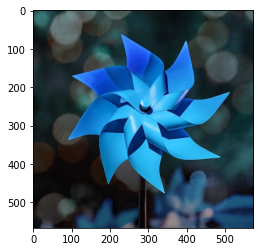

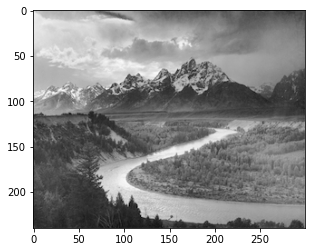

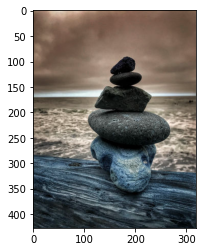

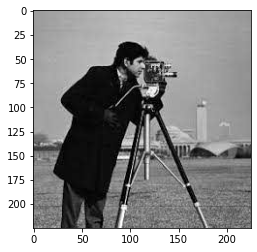

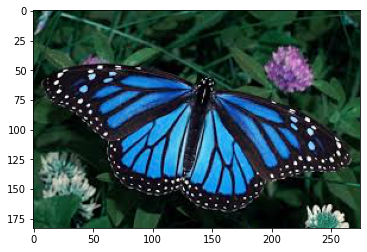

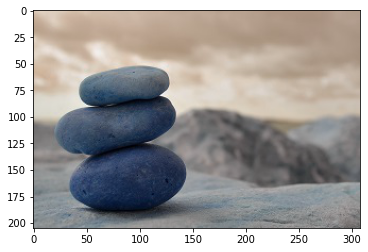

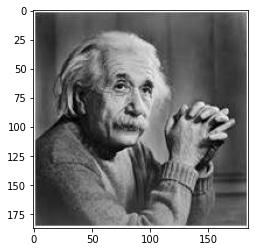

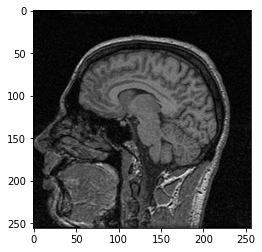

In [5]:
rgb_images = []
for i,path in enumerate(image_paths):
  image = mpimg.imread(path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  rgb_images.append(image)
  displayImage(image)

##Grayscale images 

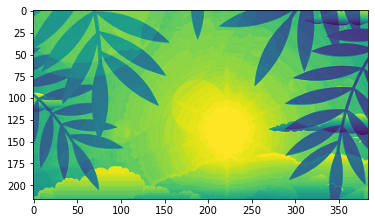

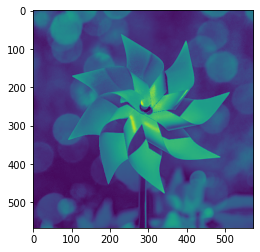

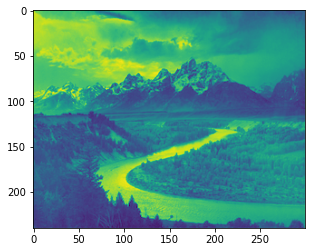

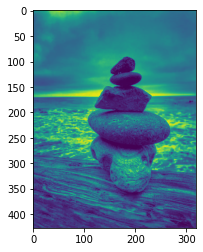

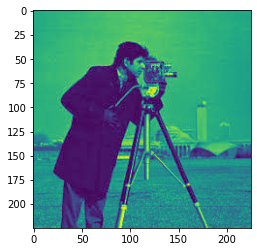

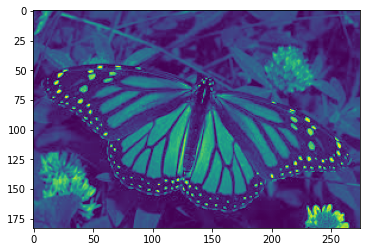

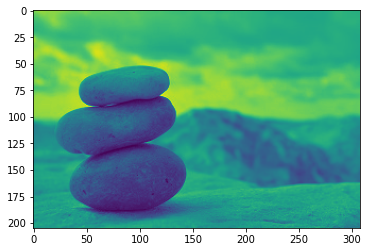

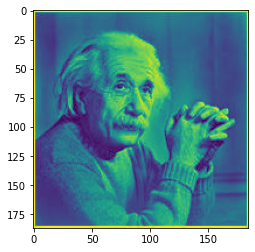

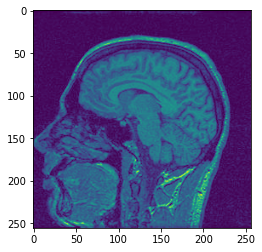

In [6]:
gray_images = []
for i,image in enumerate(rgb_images):
  gray_image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  gray_images.append(gray_image)
  displayImage(gray_image)

#Task 2.2

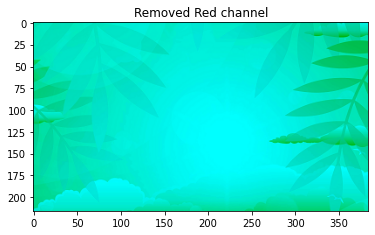

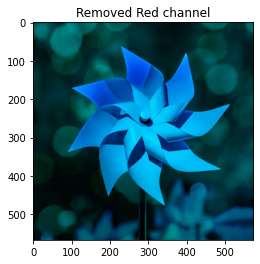

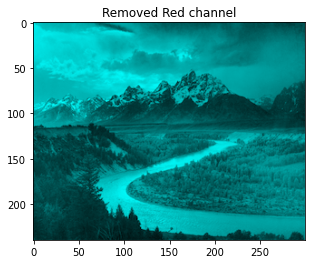

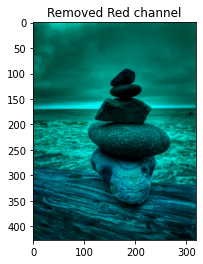

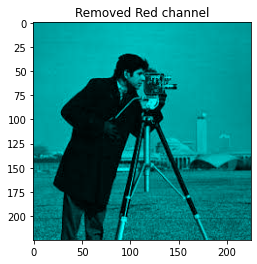

...

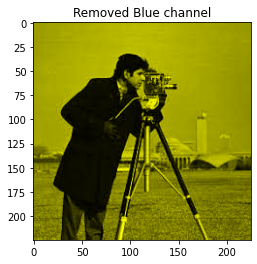

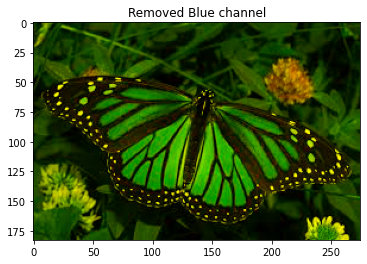

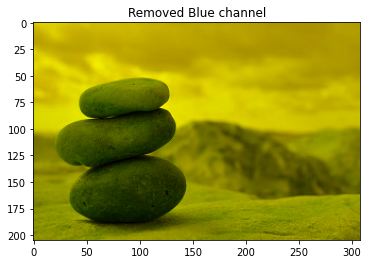

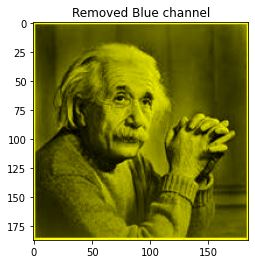

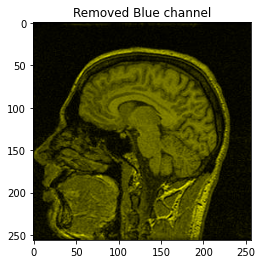

In [7]:
for i in range(3):
  if(i==0):
    title = 'Removed Red channel'
  if(i==1):
    title = 'Removed Green channel'
  if(i==2):
    title = 'Removed Blue channel'
  for image in (rgb_images):
    displayImage(rgbExclusion(image.copy(),i),title)

#Task 2.3

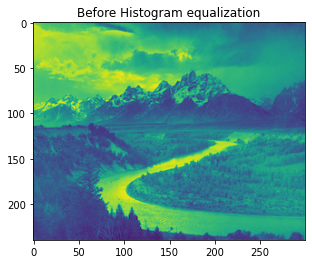

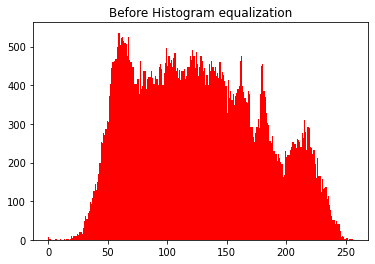

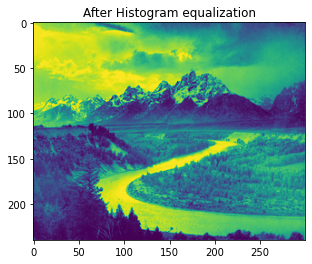

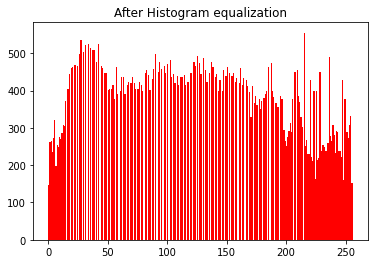

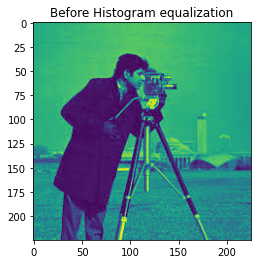

...

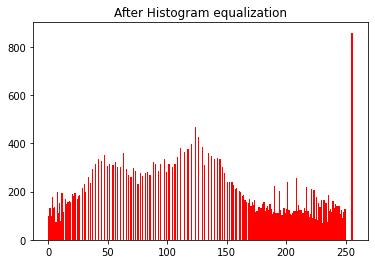

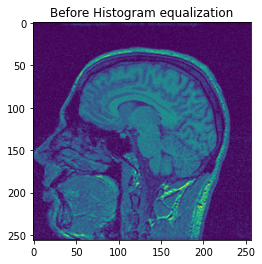

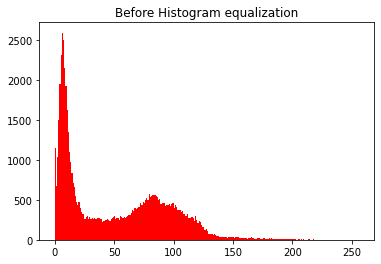

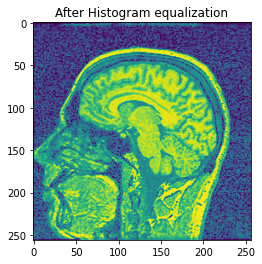

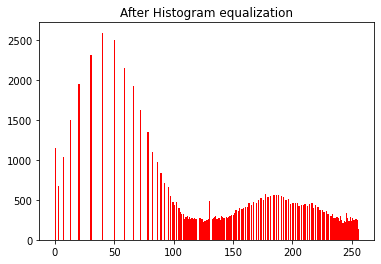

In [8]:
before_equalize_title = 'Before Histogram equalization'
after_equalize_title = 'After Histogram equalization'

hist_images_array = [2,4,7,8]
for i in (hist_images_array):
  displayImage(gray_images[i],before_equalize_title)
  hist_image_data = gray_images[i].flatten(),256,[0,256]
  hist,bins = np.histogram(gray_images[i].flatten(),256,[0,256])
  plt.hist(gray_images[i].flatten(),256,[0,256], color = 'r')
  plt.title(before_equalize_title)
  plt.show()
  equalized_image = cv2.equalizeHist(gray_images[i])
  displayImage(equalized_image,after_equalize_title)
  plt.hist(equalized_image.flatten(),256,[0,256], color = 'r')
  plt.title(after_equalize_title)
  plt.show()


#Task 2.4

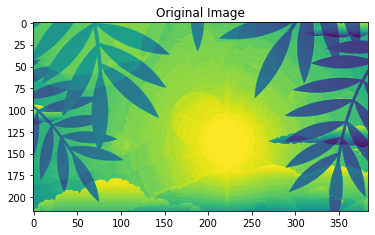

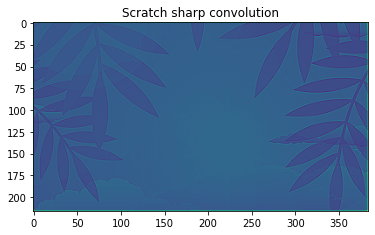

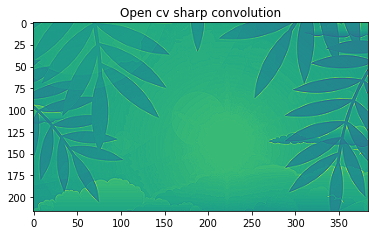

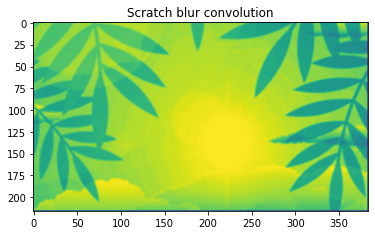

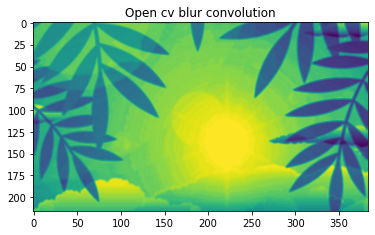

...

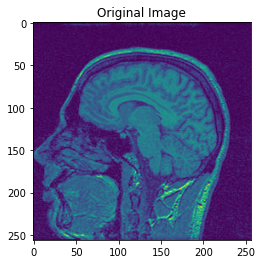

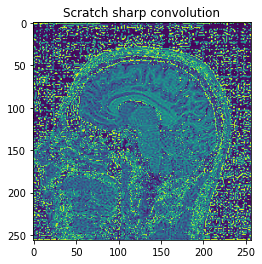

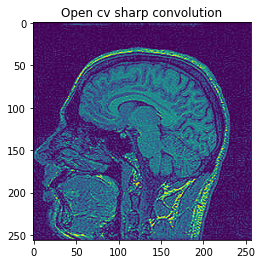

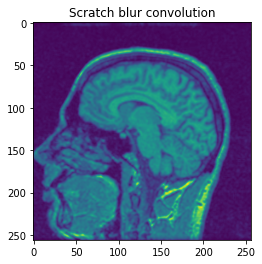

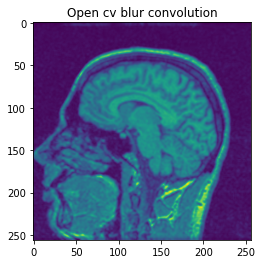

In [9]:
sharp_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
blur_filter = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])/9.0

for image in gray_images:
  displayImage(image,'Original Image')
  displayImage(convolveImage(image, sharp_kernel),'Scratch sharp convolution')
  displayImage(cv2.filter2D(image, -1, sharp_kernel),'Open cv sharp convolution')

  displayImage(convolveImage(image, blur_filter),'Scratch blur convolution')
  displayImage(cv2.filter2D(image, -1, blur_filter),'Open cv blur convolution')

#Generic function for adding noise

In [10]:
def noisy(noise_typ,image):
   if noise_typ == "gauss":
      mean = 0
      var = 0.1
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,image.shape)
      gauss = gauss.reshape(image.shape)
      noisy = image + gauss
      return noisy
   elif noise_typ == "s&p":
      s_vs_p = 0.5
      amount = 0.004
      out = np.copy(image)
      # Salt mode
      num_salt = np.ceil(amount * image.size * s_vs_p)
      coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
      out[coords] = 1

      # Pepper mode
      num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
      coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
      out[coords] = 0
      return out

      
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

#Tasks 2.5 

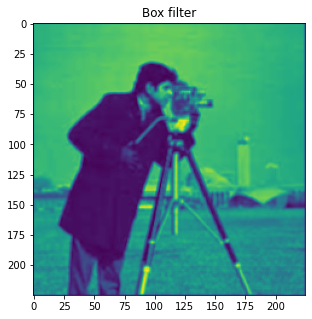

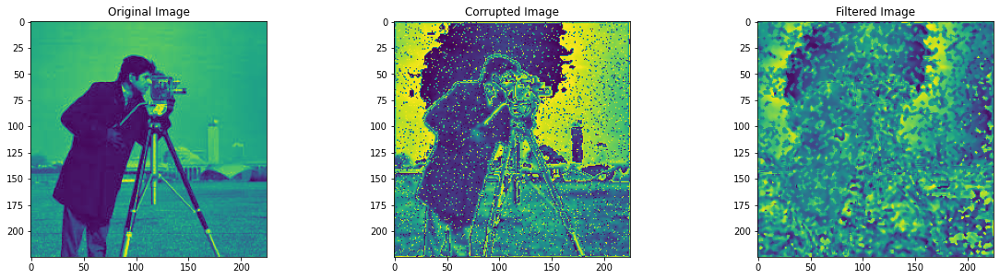

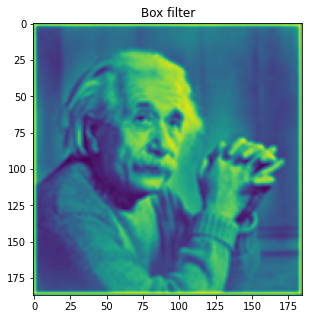

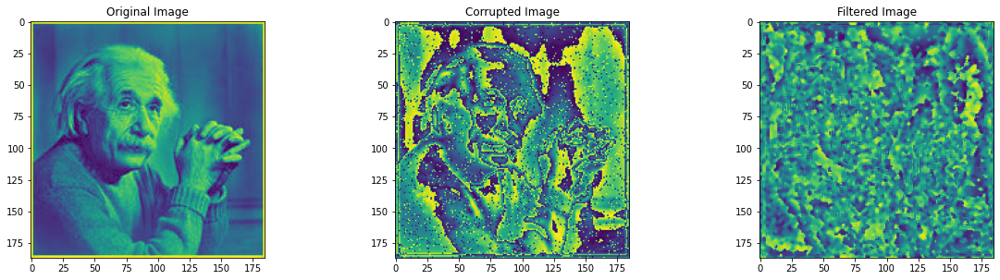

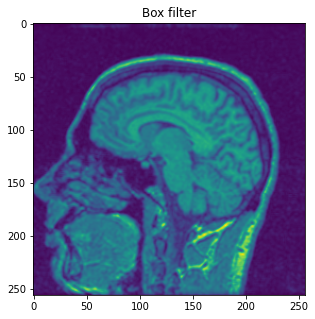

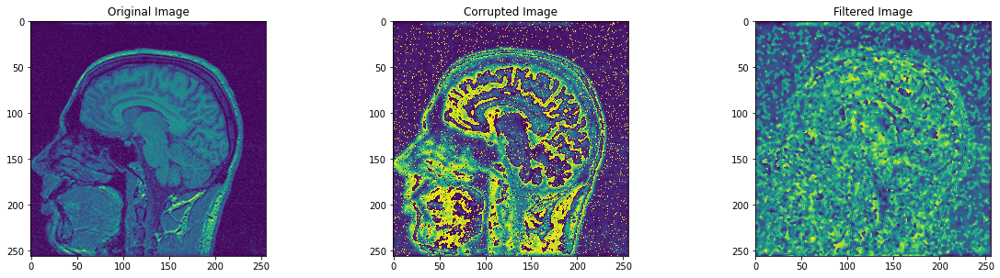

In [25]:
images_indexes = [4, 7, 8]
rows = 3
columns = 3
for index,i in enumerate(images_indexes):
  box_image = convolveImage(gray_images[i], blur_filter)
  plt.rcParams['figure.figsize'] = (5.0, 5.0) # set default size of plots
  displayImage(box_image,'Box filter')
  sigma = randint(1,5)
  gaussian_kernel = cv2.getGaussianKernel(3, sigma)
  gaussian_image = convolveImage(box_image, gaussian_kernel)
  gaussian_noisy_image = gaussian_image+random_noise(gaussian_image, mode='gaussian', seed=None, clip=True)
  s_p_noisy_image = sp_noise(gaussian_noisy_image,0.05)
  sigma = randint(1,5)
  new_gaussian_kernel = cv2.getGaussianKernel(3, sigma)
  new_gaussian_image = convolveImage(s_p_noisy_image, gaussian_kernel)
  median_image = cv2.medianBlur(new_gaussian_image, 3)
  plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
  plt.subplot(rows, columns, 1)
  plt.imshow(gray_images[i])
  plt.title('Original Image')
  plt.subplot(rows, columns, 2)
  plt.imshow(s_p_noisy_image)
  plt.title('Corrupted Image')
  plt.subplot(rows, columns, 3)
  plt.imshow(median_image)
  plt.title('Filtered Image')
  plt.show()

#Task 2.6

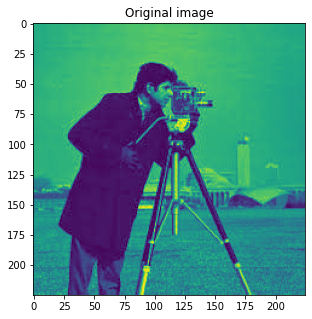

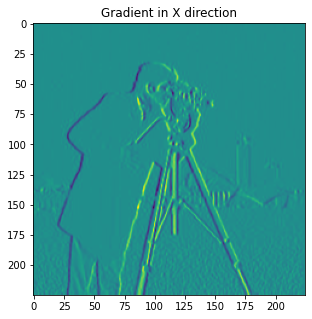

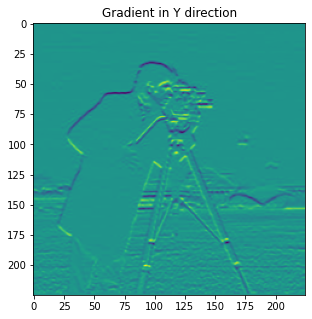

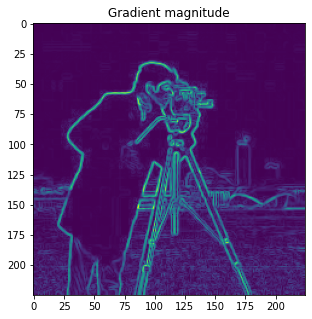

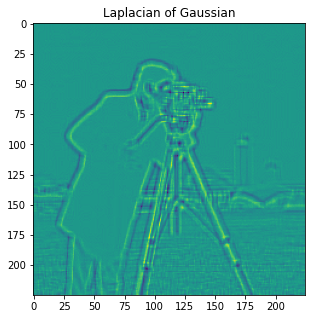

...

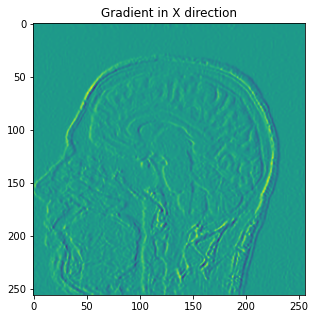

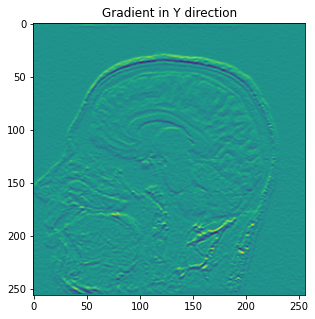

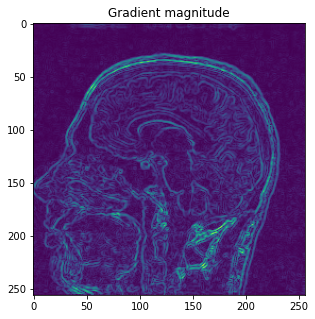

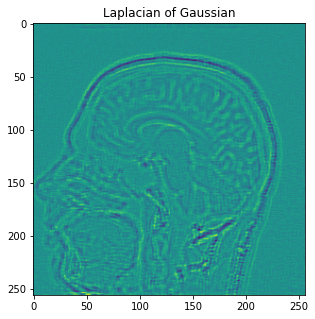

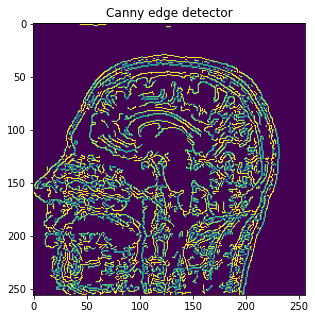

In [28]:
for index,i in enumerate(images_indexes):
  gradx = cv2.Sobel(gray_images[i],cv2.CV_64F,1,0,ksize=3)
  grady = cv2.Sobel(gray_images[i],cv2.CV_64F,0,1,ksize=3)
  gradmag = cv2.magnitude(gradx,grady)
  gaussian = cv2.GaussianBlur(gray_images[i],(5,5),randint(1,5))
  LoG = cv2.Laplacian(gaussian,cv2.CV_64F)
  canny = cv2.Canny(gray_images[i],100,200)
  plt.rcParams['figure.figsize'] = (5.0, 5.0) # set default size of plots
  displayImage(gray_images[i],'Original image')
  displayImage(gradx,'Gradient in X direction')
  displayImage(grady,'Gradient in Y direction')
  displayImage(gradmag,'Gradient magnitude')
  displayImage(LoG,'Laplacian of Gaussian')
  displayImage(canny,'Canny edge detector')
